### Image and Video Processing - EE6310
### Assignment 4

In [53]:
import numpy as np
import matplotlib.pyplot as plt

In [54]:
def read_image(path):
    image = plt.imread(path)
    return image

def display_image(image, size = 4, title = None):
    aspect_ratio = image.shape[1]/image.shape[0]
    plt.figure(figsize=(size*aspect_ratio, size))
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.show()

In [55]:
def DFT(image, centering = False):
    N = image.shape[0]
    matrix = np.zeros((N, N), dtype = np.complex128)

    w_n = np.exp(-2j * np.pi/N)

    for i in range(N):
        for j in range(N):
            if (centering):
                matrix[i][j] = (w_n ** (i * j)) * (-1) ** (i + j)
            else:
                matrix[i][j] = (w_n ** (i * j))

    I_DFT = np.dot((np.dot(matrix, image)), matrix)

    return I_DFT

def IDFT(dft):
    N = dft.shape[0]
    matrix = np.zeros((N, N), dtype = np.complex128)
    IDFT = np.zeros((N, N), dtype = np.float32)

    w_n = np.exp(-2j * np.pi/N)

    for i in range(N):
        for j in range(N):
            matrix[i][j] =(1/N) * w_n ** (-1*(i * j))

    IDFT = np.dot((np.dot(matrix, dft)), matrix)

    return IDFT

def circularConv_withDFT(image1, image2):
    N = max(image1.shape[0], image2.shape[0])
    M = max(image1.shape[1], image2.shape[1])

    image1 = np.pad(image1, [(0, N - image1.shape[0]), (0, M - image1.shape[1])], mode = 'constant')
    image2 = np.pad(image2, [(0, N - image2.shape[0]), (0, M - image2.shape[1])], mode = 'constant')
    
    return np.round(np.real(IDFT(DFT(image1) * DFT(image2))))

def linearConv_withDFT(image1, image2):

    image1 = np.pad(image1, [(0, image2.shape[0] - 1), (0, image2.shape[1] - 1)], mode = 'constant')
    image2 = np.pad(image2, [(0, image1.shape[0] - 1), (0, image1.shape[0] - 1)], mode = 'constant')
    
    return circularConv_withDFT(image1, image2) [1:image2.shape[0], 1:image1.shape[1]]

#### 1. Image Quality Assessment
In this problem you will compare the two full reference image quality assessment techniques discussed in class – PSNR (MSE) and the SSIM index. This problem is aimed at understanding the shortcomings of PSNR (MSE) in measuring image quality.

1. Write a Python function that accepts a pair of images of identical dimensions and computes the MSE
and PSNR between them.

In [56]:
def mse_images(image1, image2):
    m = image1.shape[1]
    n = image1.shape[0]
    mse = 0

    diff = image1 - image2
    mse = np.sum(diff**2)/(m*n)
    return mse

def psnr_images(image1, image2):
    mse = mse_images(image1, image2)
    return 10*np.log10(255**2/mse)

In [57]:
image1 = read_image('misc/5.1.11.tiff')
image2 = read_image('misc/5.1.12.tiff')

# display_image(image1, title='Image 1')
# display_image(image2, title='Image 2')

# print("Mean:", mse_images(image1, image2))
# print("PSNR:", psnr_images(image1, image2))

2. Write a Python function that accepts a pair of images of identical dimensions and computes the SSIM index between them. The function should return the mean SSIM (MSSIM) index as well as the SSIM map. Use the definition of the SSIM index from the slides and use a Gaussian window for the weighted mean, variance and covariance computations.

In [58]:
def gaussian_window(window_size, sigma):
    window = np.zeros((window_size, window_size))
    for i in range(window_size):
        for j in range(window_size):
            window[i, j] = (1/(2*np.pi*(sigma**2))) * np.exp(-((i - window_size//2)**2 + (j - window_size//2)**2)/(2*sigma**2))
    return window

In [59]:
def luminance_similarity(image1, image2, i, j, window):
    # accepts an image which has been padded with window_size // 2 on all sides
    mu_image1 = np.sum(image1[i - window.shape[0] // 2 : i + 1 + window.shape[0] // 2, j - window.shape[1] // 2 :j + 1 + window.shape[1] // 2] * window)
    mu_image2 = np.sum(image2[i - window.shape[0] // 2 : i + 1 + window.shape[0] // 2, j - window.shape[1] // 2 :j + 1 + window.shape[1] // 2] * window)

    C1 = (0.01 * 255)**2
    L = (2 * mu_image1 * mu_image2 + C1) / (mu_image1**2 + mu_image2**2 + C1)

    return mu_image1, mu_image2, L

In [60]:
def contrast_similarity(image1, image2, i, j, window, mu_image1, mu_image2):
    # accepts images which have been padded with window_size // 2 on all sides

    sigma_image1 = np.sqrt(np.sum((image1[i - window.shape[0] // 2 : i + 1 + window.shape[0] // 2, j - window.shape[1] // 2 :j + 1 + window.shape[1] // 2] - mu_image1)**2 * window))
    sigma_image2 = np.sqrt(np.sum((image2[i - window.shape[0] // 2 : i + 1 + window.shape[0] // 2, j - window.shape[1] // 2 :j + 1 + window.shape[1] // 2] - mu_image2)**2 * window))

    C2 = (0.03 * 255)**2

    C = (2 * sigma_image1 * sigma_image2 + C2) / (sigma_image1**2 + sigma_image2**2 + C2) 
    return sigma_image1, sigma_image2, C  

In [61]:
def structural_similarity(image1, image2, i, j, window, mu_image1, mu_image2, sigma_image1, sigma_image2):
    # accepts images which have been padded with window_size // 2 on all sides

    temp1 = image1[i - window.shape[0] // 2 : i + 1 + window.shape[0] // 2, j - window.shape[1] // 2 :j + 1 + window.shape[1] // 2]
    temp2 = image2[i - window.shape[0] // 2 : i + 1 + window.shape[0] // 2, j - window.shape[1] // 2 :j + 1 + window.shape[1] // 2]

    sigma_1n2 = np.sum((temp1 - mu_image1) * (temp2 -mu_image2) * window) 
    C3 = (0.02 * 255)**2

    S = (sigma_1n2 + C3) / (sigma_image1 * sigma_image2 + C3)
    return S

In [62]:
def ssim(image1, image2):
    window_size = 11
    window = gaussian_window(window_size, 1) 
    window = window / np.sum(window)

    m = image1.shape[1]
    n = image1.shape[0]

    padded_image1 = np.pad(image1, window_size//2, mode='constant')
    padded_image2 = np.pad(image2, window_size//2, mode='constant')
    ssim = 0

    ssim_map = np.zeros((m, n))
    for i in range(n):
        for j in range(m):
            i_new = i + window_size//2
            j_new = j + window_size//2

            mu_image1, mu_image2, L = luminance_similarity(padded_image1, padded_image2, i_new, j_new, window)
            sigma_image1, sigma_image2, C = contrast_similarity(padded_image1, padded_image2, i_new, j_new, window, mu_image1, mu_image2)
            S = structural_similarity(padded_image1, padded_image2, i_new, j_new, window, mu_image1, mu_image2, sigma_image1, sigma_image2)

            ssim += L * C * S
            ssim_map[i - window_size//2, j - window_size//2] = L * C * S
    return ssim/(m*n), ssim_map

Write a program to generate the following distortions:
1. Mean shift by 16.

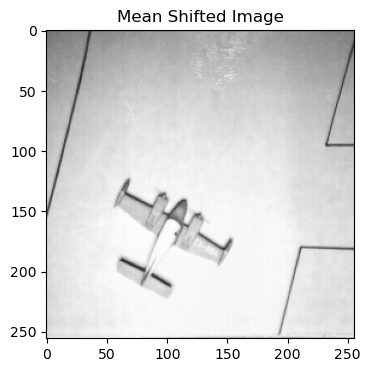

In [63]:
def mean_shift(image, shift_value):
    shifted_image = np.zeros(image.shape)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            shifted_image[i, j] = image[i, j] + shift_value
            if (shifted_image[i, j] > 255):
                shifted_image [i, j] = 255
            elif (shifted_image[i, j] < 0):
                shifted_image[i, j] = 0
    
    return shifted_image

image = mean_shift(image1, 16)
display_image(image, title='Mean Shifted Image')

2. Additive white gaussian noise (AWGN) with standard deviation σ = 16.

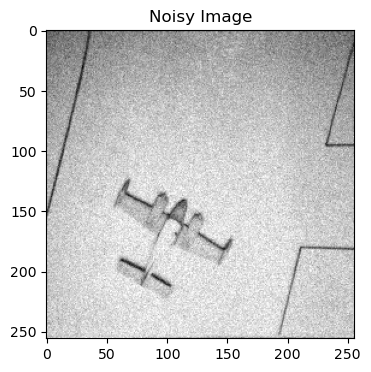

In [64]:
def AWGN(image, sigma):
    noise = np.random.normal(0, sigma, image.shape)

    noisy_image = np.zeros(image.shape)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):

            noisy_image[i, j] = image[i, j] + noise[i, j]
            if (noisy_image[i, j] > 255):
                noisy_image [i, j] = 255
            elif (noisy_image[i, j] < 0):
                noisy_image[i, j] = 0
    
    return noisy_image

image = AWGN(image1, 16)
display_image(image, title='Noisy Image')

3. JPEG compression at quality level 10. Use any open source Python library for this.

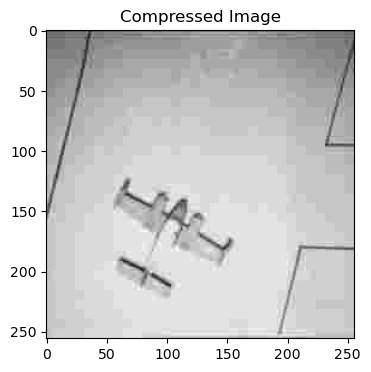

In [65]:
from PIL import Image

def jpeg_conversion(image, save_path = 'compressed.jpeg', quality = 10):
    
    image = Image.fromarray(image)
    image.save(save_path, quality = quality)
    compressed_image = np.asarray(Image.open(save_path), dtype=np.int32)

    return compressed_image
compressed_image = jpeg_conversion(image1, quality = 10)
display_image(compressed_image, title='Compressed Image')

4. Gaussian blur using a 5×5 window with σ = 2.

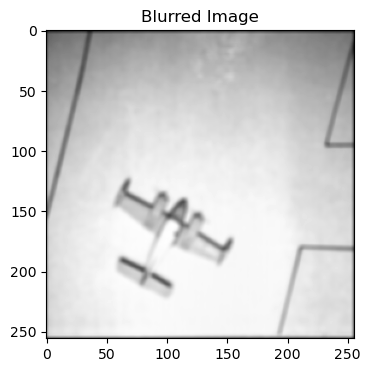

In [66]:
def gaussian_blur(image, window_size, sigma):
    gaussian_kernel = gaussian_window(window_size, sigma)
    # gaussian_kernel = gaussian_kernel / np.sum(gaussian_kernel)
    padded_image = np.pad(image, window_size//2, mode='constant')

    blurred_image = np.zeros(image.shape)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            i_new = i + window_size//2
            j_new = j + window_size//2

            roi_image = padded_image[i_new - window_size // 2: i_new + 1 + window_size // 2, j_new - window_size // 2: j_new + 1 + window_size//2]
            blurred_image[i, j] = np.sum(np.multiply(roi_image, gaussian_kernel))

    return blurred_image

blurred_image = gaussian_blur(image1, 5, 2)
display_image(blurred_image, title='Blurred Image')

Work with 3 images of your choice from the set mentioned in the instructions. Subject the images to the distortions mentioned above. Compute the MSE, PSNR and SSIM index for each distortion. Also, rate the images yourself (subjectively) using a continuous scale between 0 and 1. Compute the correlation between your scores and PSNR, your scores and SSIM. What can you conclude about the two metrics?

1st image:

Mean Shifted Image :
MSE: 256.0
PSNR: 24.04840395556061
SSIM: 0.996314261122534


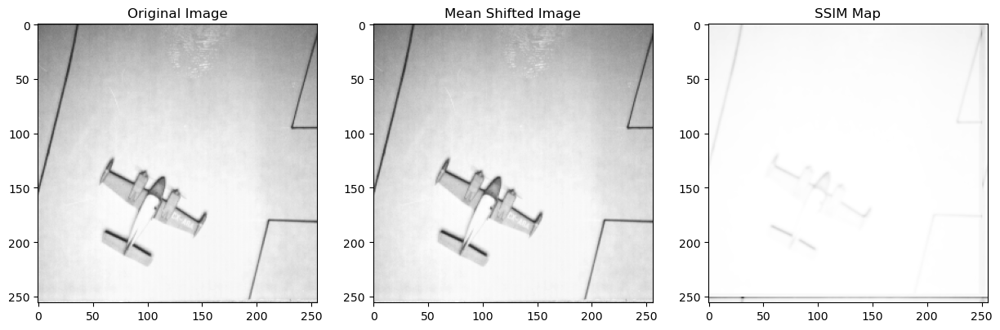

AWGN Image :
MSE: 251.8413959820403
PSNR: 24.119532428445282
SSIM: 0.31730274621867766


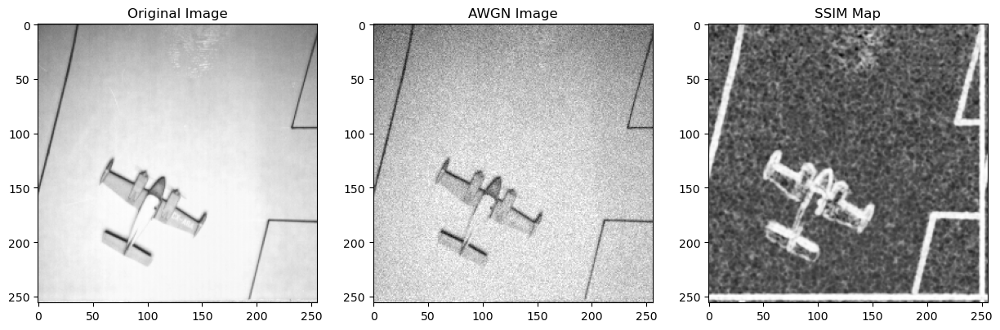

JPEG Image :
MSE: 45.61248779296875
PSNR: 31.539966007231477
SSIM: 0.8673262889204916


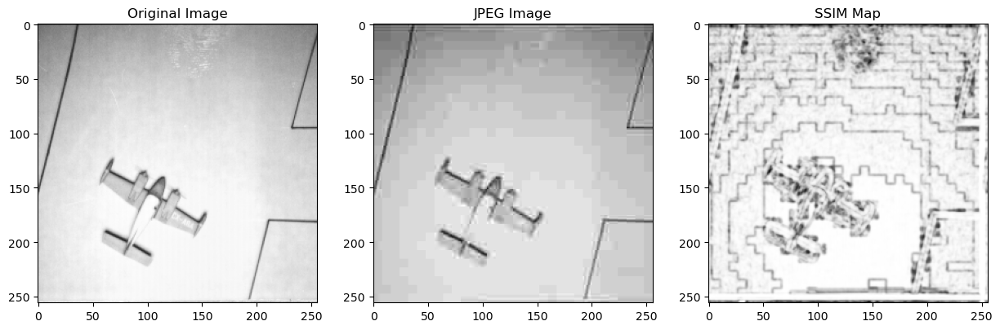

Blurred Image :
MSE: 5492.32377691059
PSNR: 10.733242295390113
SSIM: 0.8017291168597567


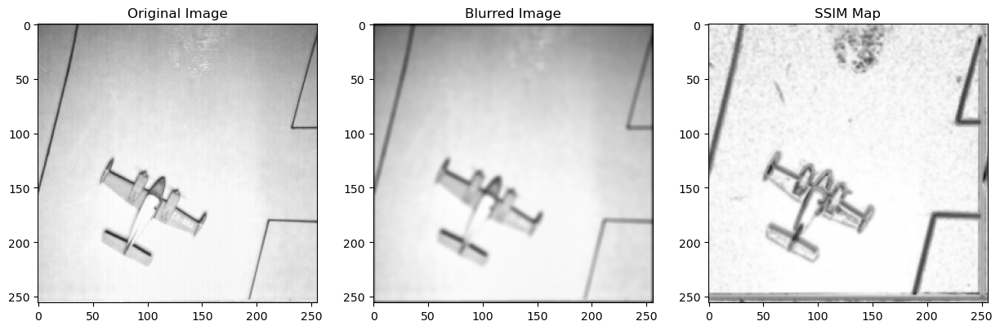

In [67]:
image1 = read_image('misc/5.1.11.tiff')

mean_shifted_image1 = mean_shift(image1, 16)
awgn_image1 = AWGN(image1, 16)
jpeg_image1 =  jpeg_conversion(image1, save_path = 'compressed_image.jpeg', quality = 10)
blurred_image1 = gaussian_blur(image1, 5, 2)

distorted_images = [mean_shifted_image1, awgn_image1, jpeg_image1, blurred_image1]
names = ['Mean Shifted Image', 'AWGN Image', 'JPEG Image', 'Blurred Image']

for i, dis_image in enumerate(distorted_images):
    print(names[i], ":")
    fig = plt.figure(figsize = (15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image1, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(dis_image, cmap='gray')
    plt.title(names[i])
    

    print("MSE:", mse_images(image1, dis_image))
    print("PSNR:", psnr_images(image1, dis_image))
    ssim_index, ssim_map = ssim(image1, dis_image)
    print("SSIM:", ssim_index)

    plt.subplot(1, 3, 3)
    plt.imshow(ssim_map, cmap='gray')
    plt.title('SSIM Map')
    plt.show()

Human Opinion Score:

Mean Shifted image: 1 <br/>
AWGN added image: 0.6 <br/>
JPEG image: 0.8 <br/>
Blurred image: 0.75 <br/>

Image 2:

Mean Shifted Image :
MSE: 255.75466918945312
PSNR: 24.05256789706766
SSIM: 0.9939356010053086


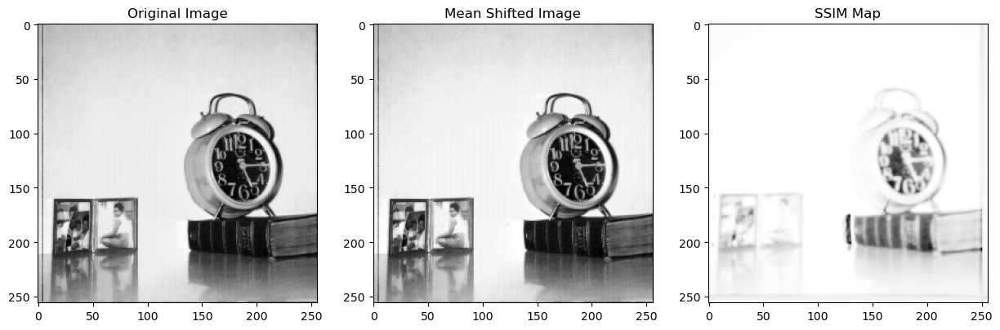

AWGN Image :
MSE: 245.0462317399352
PSNR: 24.238323324405457
SSIM: 0.4163087694821037


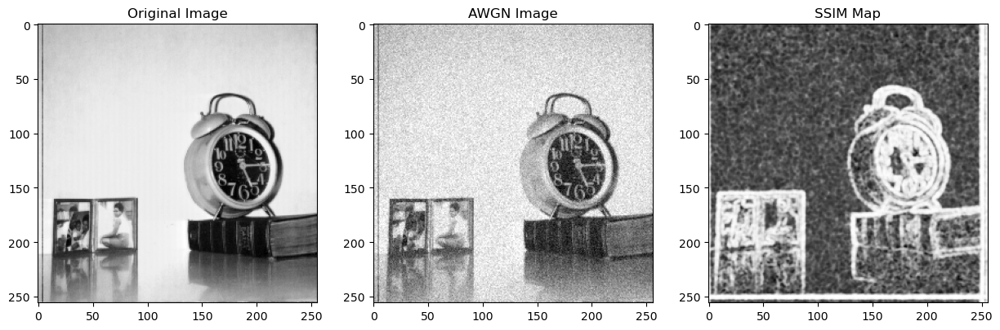

JPEG Image :
MSE: 86.36424255371094
PSNR: 28.76746392416356
SSIM: 0.8663768818144956


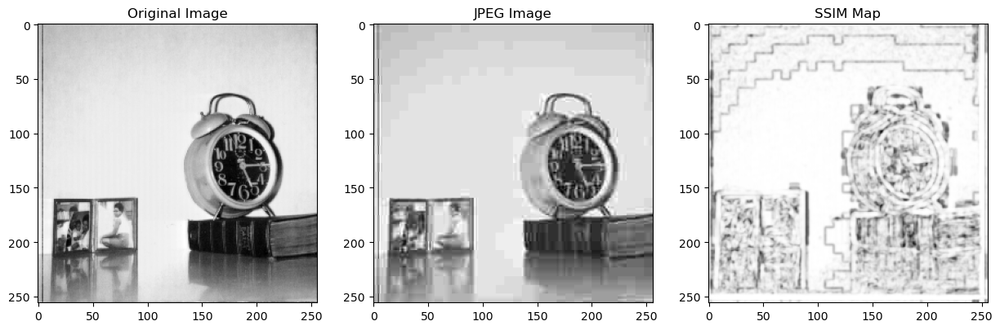

Blurred Image :
MSE: 5538.9934397899715
PSNR: 10.696495100856794
SSIM: 0.734979581490492


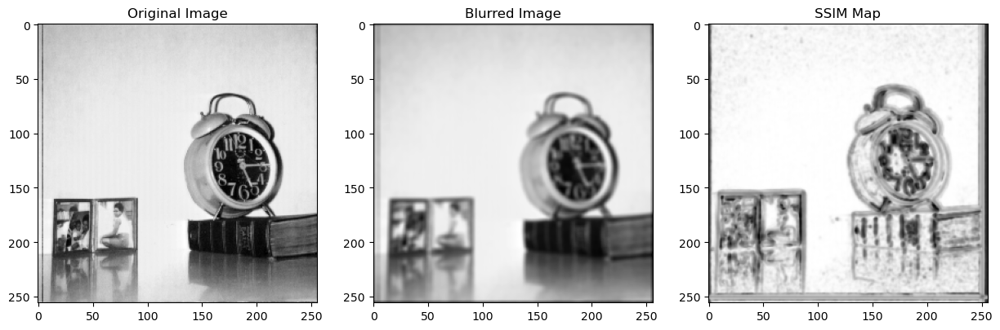

In [68]:
image2 = read_image('misc/5.1.12.tiff')

mean_shifted_image2 = mean_shift(image2, 16)
awgn_image2 = AWGN(image2, 16)
jpeg_image2 =  jpeg_conversion(image2, save_path = 'compressed_image.jpeg', quality = 10)
blurred_image2 = gaussian_blur(image2, 5, 2)

distorted_images = [mean_shifted_image2, awgn_image2, jpeg_image2, blurred_image2]
names = ['Mean Shifted Image', 'AWGN Image', 'JPEG Image', 'Blurred Image']

for i, dis_image in enumerate(distorted_images):
    print(names[i], ":")
    fig = plt.figure(figsize = (15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image2, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(dis_image, cmap='gray')
    plt.title(names[i])
    

    print("MSE:", mse_images(image2, dis_image))
    print("PSNR:", psnr_images(image2, dis_image))
    ssim_index, ssim_map = ssim(image2, dis_image)
    print("SSIM:", ssim_index)

    plt.subplot(1, 3, 3)
    plt.imshow(ssim_map, cmap='gray')
    plt.title('SSIM Map')
    plt.show()

Human Opinion Score:

Mean Shifted image: 1 <br/>
AWGN added image: 0.55 <br/>
JPEG image: 0.85 <br/>
Blurred image: 0.75 <br/>

Image 3:

Mean Shifted Image :
MSE: 254.3323516845703
PSNR: 24.076787538796008
SSIM: 0.9833172303844564


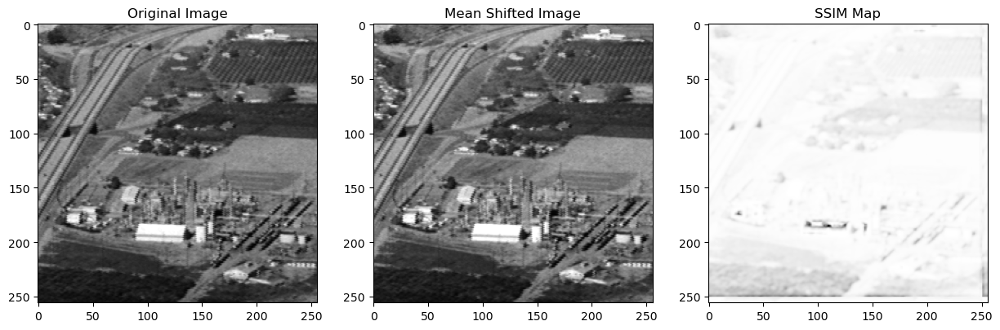

AWGN Image :
MSE: 254.11867484630233
PSNR: 24.08043778916
SSIM: 0.5844495257725381


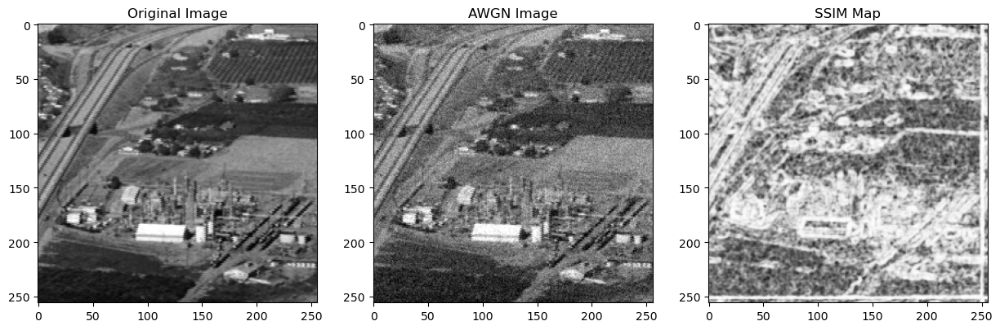

JPEG Image :
MSE: 138.2153778076172
PSNR: 26.725239956484415
SSIM: 0.7330408455839501


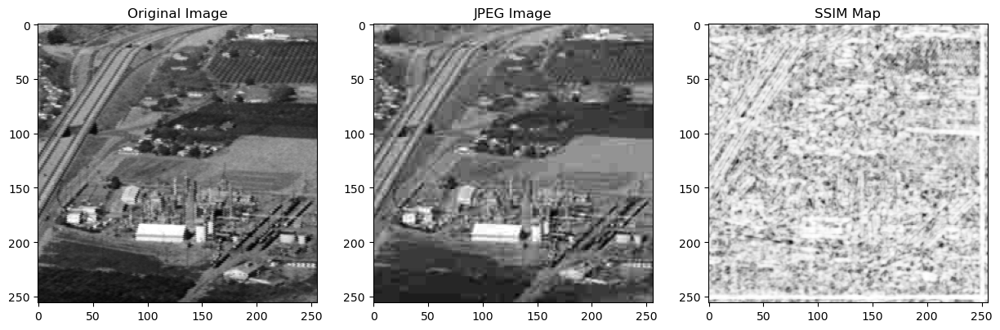

Blurred Image :
MSE: 2001.200750856164
PSNR: 15.117897037079942
SSIM: 0.544360234976492


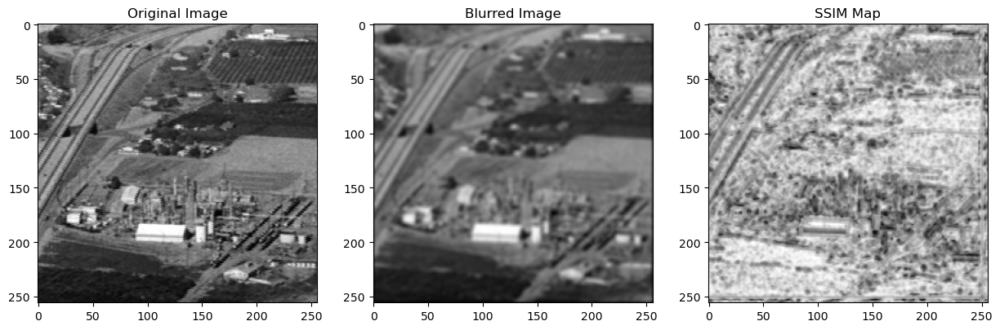

In [69]:
image3 = read_image('misc/5.1.14.tiff')

mean_shifted_image3 = mean_shift(image3, 16)
awgn_image3 = AWGN(image3, 16)
jpeg_image3 =  jpeg_conversion(image3, save_path = 'compressed_image.jpeg', quality = 10)
blurred_image3 = gaussian_blur(image3, 5, 2)

distorted_images = [mean_shifted_image3, awgn_image3, jpeg_image3, blurred_image3]
names = ['Mean Shifted Image', 'AWGN Image', 'JPEG Image', 'Blurred Image']

for i, dis_image in enumerate(distorted_images):
    print(names[i], ":")
    fig = plt.figure(figsize = (15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image3, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(dis_image, cmap='gray')
    plt.title(names[i])
    

    print("MSE:", mse_images(image3, dis_image))
    print("PSNR:", psnr_images(image3, dis_image))
    ssim_index, ssim_map = ssim(image3, dis_image)
    print("SSIM:", ssim_index)

    plt.subplot(1, 3, 3)
    plt.imshow(ssim_map, cmap='gray')
    plt.title('SSIM Map')
    plt.show()

Human Opinion Score:

Mean Shifted image: 1 <br/>
AWGN added image: 0.7 <br/>
JPEG image: 0.8 <br/>
Blurred image: 0.5 <br/>

As per my personal observations, SSIM index is more correlated to the human opinion score than PSNR.
However, for some images, I feel the SSIM index is not very correlated with the human opinion score. I have judged the images based on how much detail I was able to get from each of the images. In some images, those gaussian noise was added the main features in the image remained intact due to which I have given a higher score to it. However, the SSIM index was low for it.

#### 2. Edge Detection

In this problem, you will write a program to compute the edge map of an image. 
##### 2.1 Gradient Edge Detectors

Gradient Operators:
1. Centered 2-D differencing
2. Roberts operator.
3. Prewitt operator.
3. Sobel operator.

Estimate gradient magnitude using the following definitions:
1. $M(i, j) = \sqrt{\Delta^2_x (i, j) + \Delta^2_y (i, j)} $</br>
2. $M(i, j) = |\Delta_x (i, j)|+ |\Delta_y (i, j)|$</br>
3. $M(i, j) = max\{|\Delta_x (i, j)|, |\Delta_y (i, j)|\}$

Threshold the magnitude map using an empirical threshold τ to find the edge map E.

(a) Centered 2-D differencing

In [70]:
def binarize(image, threshold):
    new_image = np.zeros(image.shape)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if (image[i, j] > threshold):
                new_image[i, j] = 1
            else:
                new_image[i, j] = 0

    return new_image

In [71]:
def correlate(image, kernel):
    padded_image = np.pad(image, ((kernel.shape[0] // 2, kernel.shape[0] // 2), (kernel.shape[1] // 2, kernel.shape[1] // 2)), mode='symmetric')
    correlated_image = np.zeros(image.shape)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            i_new = i + kernel.shape[0]//2
            j_new = j + kernel.shape[1]//2
            correlated_image[i, j] = np.sum(np.multiply(padded_image[i:i + kernel.shape[0], j:j + kernel.shape[1]], kernel))

    return correlated_image

In [72]:
def centered_diff_edge (img, gradient_choice = 1):
    gx = correlate(img, 0.5 * np.array([[-1, 0, 1]]))
    gy = correlate(img, 0.5 * np.array([[-1], [0], [1]]))

    if (gradient_choice == 1):
        edge_image = np.sqrt(gx**2 + gy**2)
    elif(gradient_choice == 2):
        edge_image = np.abs(gx) + np.abs(gy)
    else:
        edge_image = np.maximum(np.abs(gx), np.abs(gy))

    return edge_image

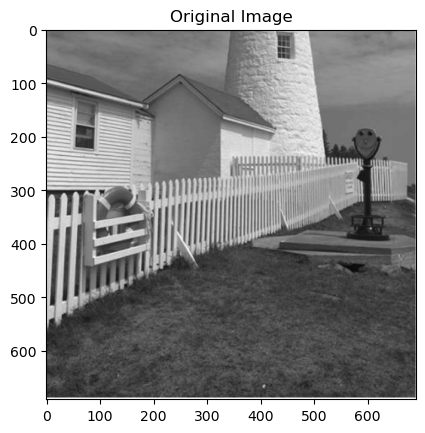

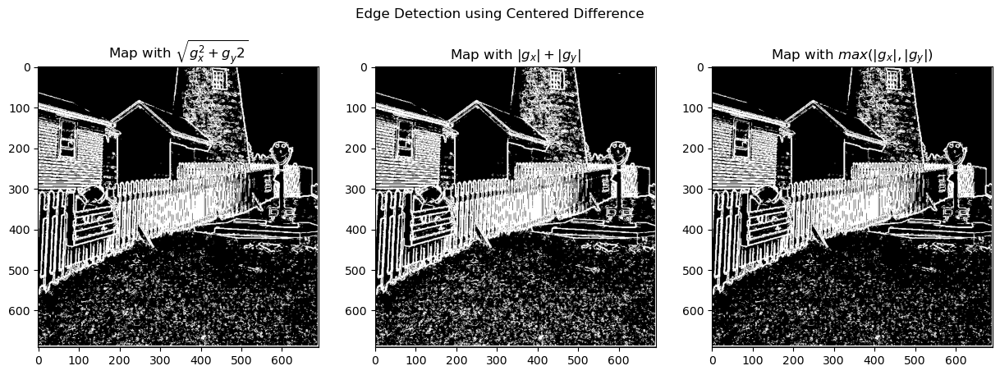

In [73]:
lighthouse_img = np.array(Image.open('lighthouse.png').convert('L'))

plt.imshow(lighthouse_img, cmap = "gray")       
plt.title("Original Image")
plt.show()

fig = plt.figure(figsize = (15, 5))
plot_names = [r"Map with $\sqrt{g_x ^2 + g_y ^ 2}$", r"Map with $|g_x| + |g_y|$", r"Map with $max(|g_x|, |g_y|)$"]

for i in range(1, 4):
    plt.subplot(1, 3, i)
    edge_map = centered_diff_edge(lighthouse_img, gradient_choice=i)
    edge_map = binarize(edge_map, np.mean(edge_map))

    plt.imshow(edge_map, cmap = "gray")
    plt.title(plot_names[i- 1])

fig.suptitle("Edge Detection using Centered Difference")
plt.show()

(b) Roberts operator

In [74]:
def roberts_operator(image, gradient_choice = 1):
    gx = correlate(image, np.array([[-1, 0], [0, 1]]))
    gy = correlate(image, np.array([[0, -1], [1, 0]]))

    if (gradient_choice == 1):
        edge_image = np.sqrt(gx**2 + gy**2)
    elif(gradient_choice == 2):
        edge_image = np.abs(gx) + np.abs(gy)
    else:
        edge_image = np.maximum(np.abs(gx), np.abs(gy))

    return edge_map

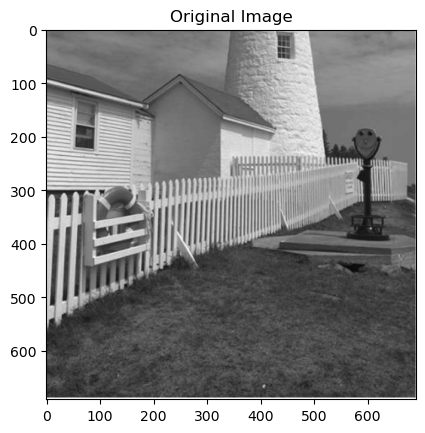

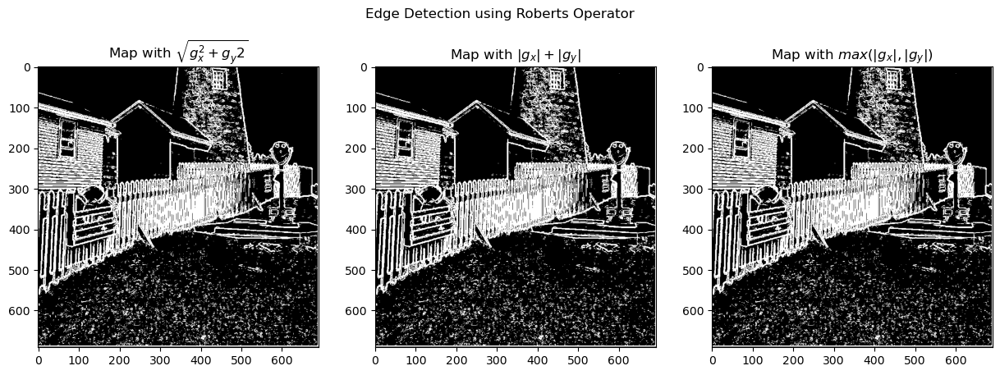

In [75]:
plt.imshow(lighthouse_img, cmap = "gray")       
plt.title("Original Image")
plt.show()

fig = plt.figure(figsize = (15, 5))

for i in range(1, 4):
    plt.subplot(1, 3, i)
    edge_map = roberts_operator(lighthouse_img, gradient_choice=i)
    edge_map = binarize(edge_map, np.mean(edge_map))

    plt.imshow(edge_map, cmap = "gray")
    plt.title(plot_names[i- 1])

fig.suptitle("Edge Detection using Roberts Operator")
plt.show()

(c) Prewitt operator

In [76]:
def prewitt_operator(image, gradient_choice = 1):
    gx = correlate(image, (1/3) * np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
    gy = correlate(image, (1/3)* np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))

    if (gradient_choice == 1):
        edge_image = np.sqrt(gx**2 + gy**2)
    elif(gradient_choice == 2):
        edge_image = np.abs(gx) + np.abs(gy)
    else:
        edge_image = np.maximum(np.abs(gx), np.abs(gy))

    return edge_map

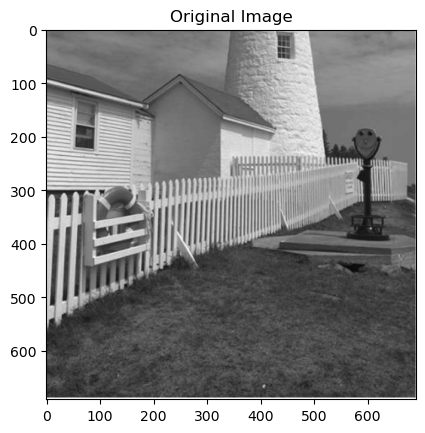

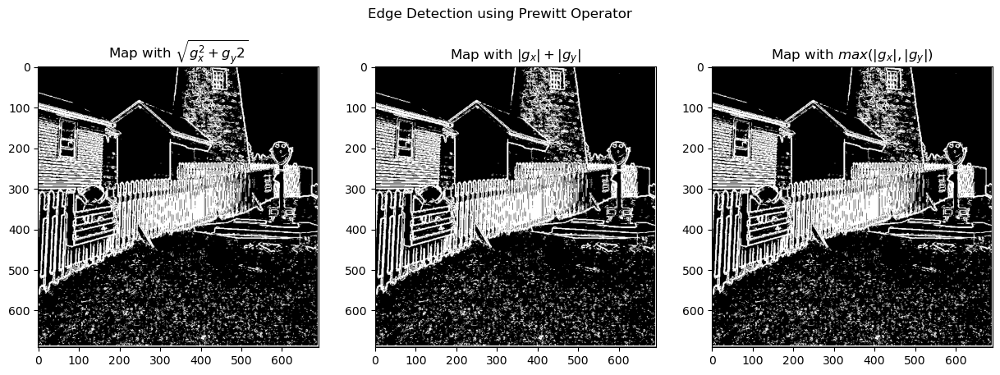

In [77]:
plt.imshow(lighthouse_img, cmap = "gray")       
plt.title("Original Image")
plt.show()

fig = plt.figure(figsize = (15, 5))

for i in range(1, 4):
    plt.subplot(1, 3, i)
    edge_map = prewitt_operator(lighthouse_img, gradient_choice=i)
    edge_map = binarize(edge_map, np.mean(edge_map))

    plt.imshow(edge_map, cmap = "gray")
    plt.title(plot_names[i- 1])

fig.suptitle("Edge Detection using Prewitt Operator")
plt.show()

In [78]:
def sobel_operator(image, gradient_choice = 1):
    gx = correlate(image, (1/4) * np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]))
    gy = correlate(image, (1/4) * np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]]))

    if (gradient_choice == 1):
        edge_image = np.sqrt(gx**2 + gy**2)
    elif(gradient_choice == 2):
        edge_image = np.abs(gx) + np.abs(gy)
    else:
        edge_image = np.maximum(np.abs(gx), np.abs(gy))

    return edge_map

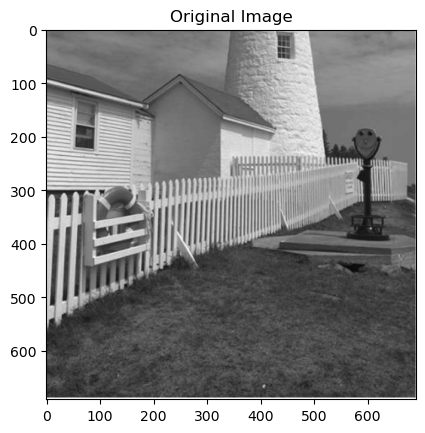

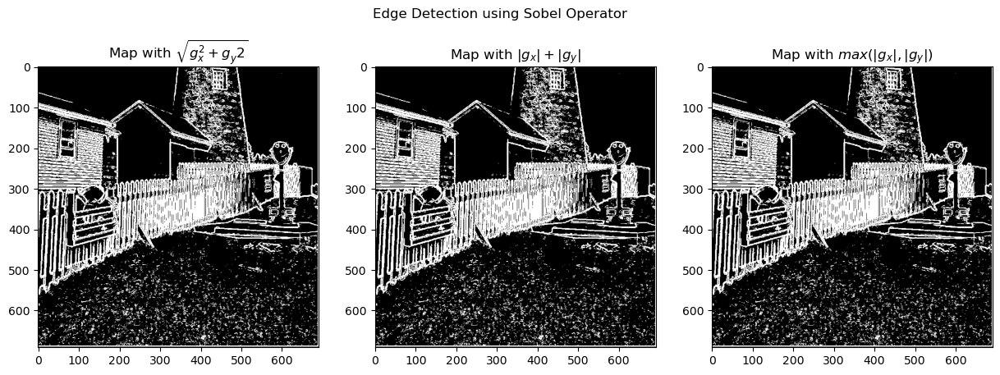

In [79]:
plt.imshow(lighthouse_img, cmap = "gray")       
plt.title("Original Image")
plt.show()

fig = plt.figure(figsize = (15, 5))

for i in range(1, 4):
    plt.subplot(1, 3, i)
    edge_map = sobel_operator(lighthouse_img, gradient_choice=i)
    edge_map = binarize(edge_map, np.mean(edge_map))

    plt.imshow(edge_map, cmap = "gray")
    plt.title(plot_names[i- 1])

fig.suptitle("Edge Detection using Sobel Operator")
plt.show()

##### 2.2 Laplacian Edge Detectors

1. Compute the Laplacian using the convolution template
2. Compute the edge map E as the output of a zero crossing detector.

In [80]:
def laplacian_edge_detector(image):
    laplacian_kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
    edge_map = correlate(image, laplacian_kernel)
    return edge_map

In [81]:
def detect_zero_crossing(image):
    padded_image = np.pad(image, 1, mode='symmetric')

    arr = [[0, 1], [1, 0]]
    edge_map = np.zeros(image.shape)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            i_new = i + 1
            j_new = j + 1

            if (padded_image[i_new, j_new] == 0):
                for index in [[0, 1], [1, 0]]:
                    if (padded_image[i_new - index[0], j_new - index[1]] * padded_image[i_new + index[0], j_new + index[1]] < 0):
                        edge_map[i, j] = 1
                        break
            else:
                for index in arr:
                    if (padded_image[i_new, j_new] * padded_image[i_new + index[0], j_new + index[1]] < 0):
                        edge_map[i, j] = 1
                        break
                    
    return edge_map

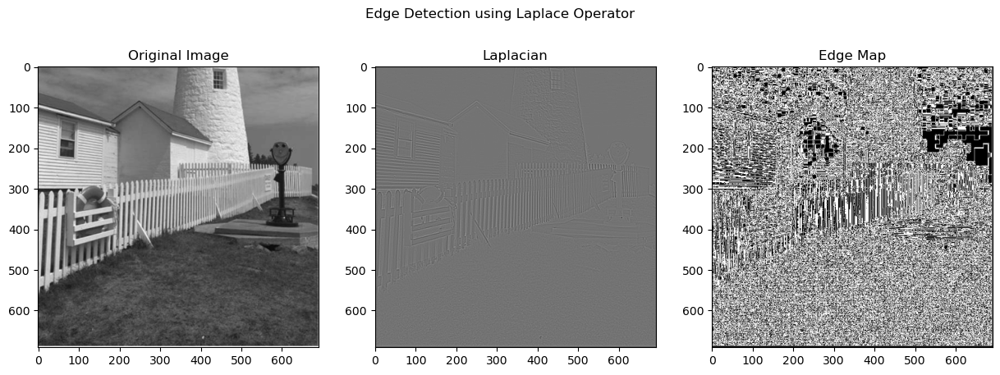

In [82]:
fig = plt.figure(figsize = (15, 5))
plt.subplot(1, 3, 1)
plt.imshow(lighthouse_img, cmap = "gray")       
plt.title("Original Image")

plt.subplot(1, 3, 2)
edge_map = laplacian_edge_detector(lighthouse_img)
plt.imshow(edge_map, cmap = "gray")
plt.title("Laplacian")

plt.subplot(1, 3, 3)
edge_map = detect_zero_crossing(edge_map)
plt.imshow(edge_map, cmap = "gray")
plt.title("Edge Map")

fig.suptitle("Edge Detection using Laplace Operator")
plt.show()


#### 2.3 Laplacian of Gaussian (LoG)

LoG was motivated by the sensitivity of gradient and Laplacian edge detectors noise. In the problem,
you will implement an edge detector using the LoG operator. Work with the lighthouse.png image that is
corrupted with AWGN whose σn = 10. Experiment with different values of σ for the Gaussian pre-filter and
compute the edge map E after zero crossing detection. Compare your result with gradient based techniques
implemented above and verify the robustness of LoG.

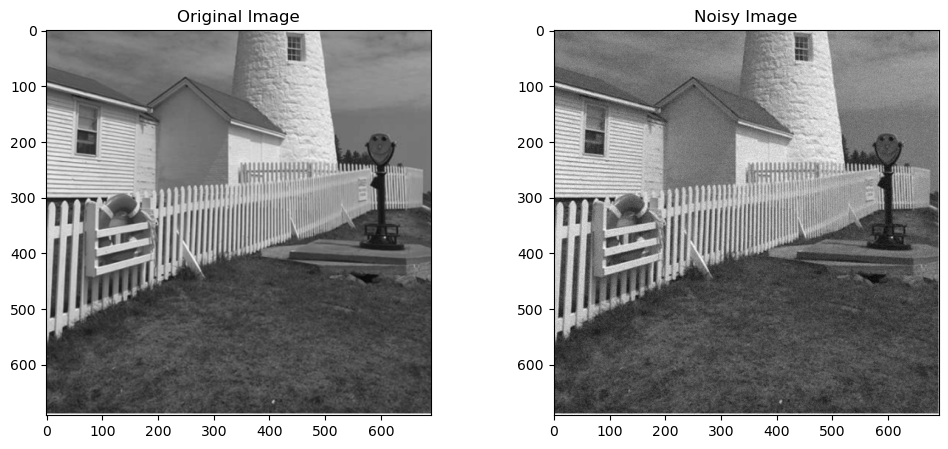

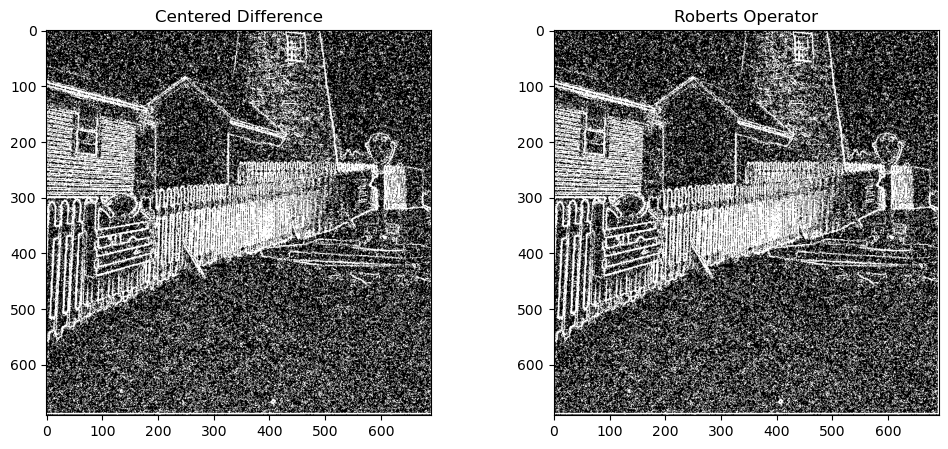

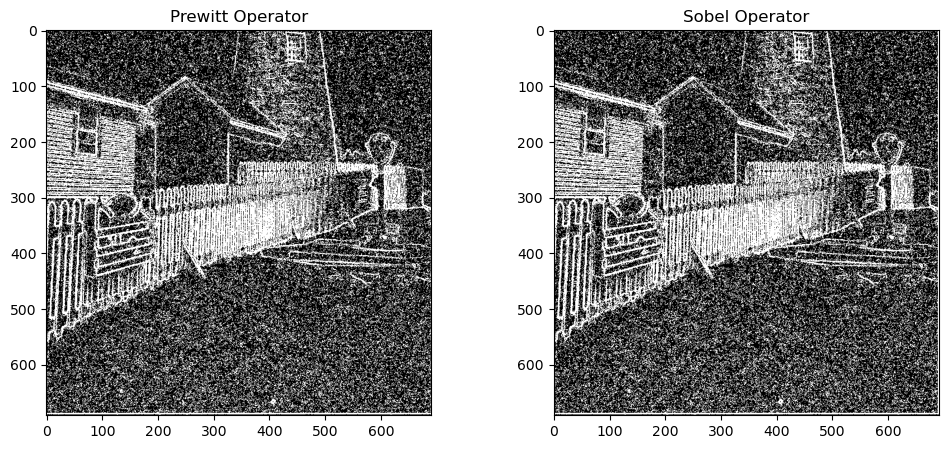

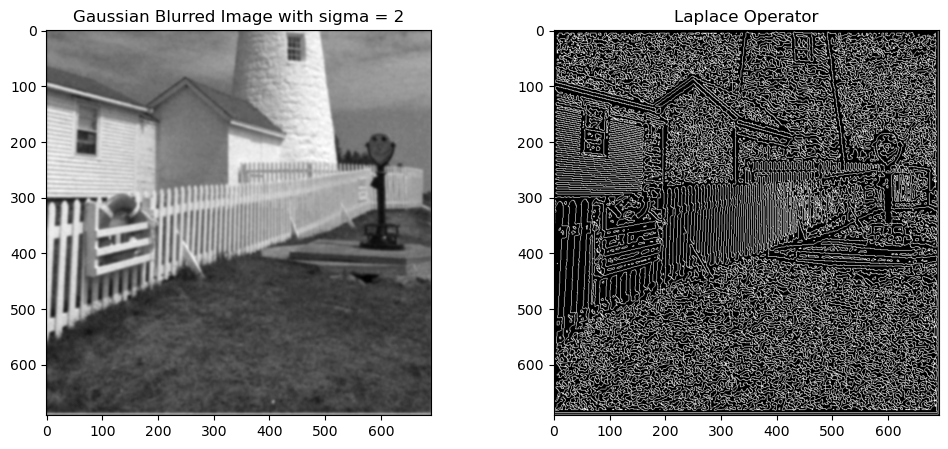

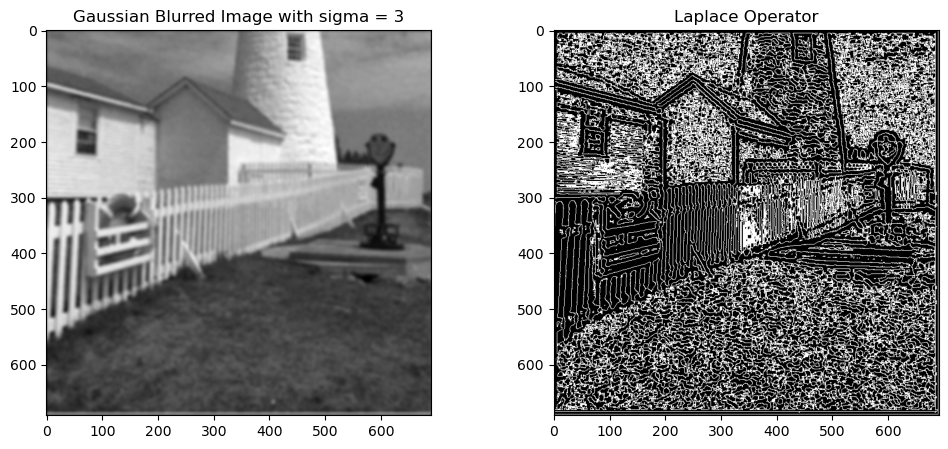

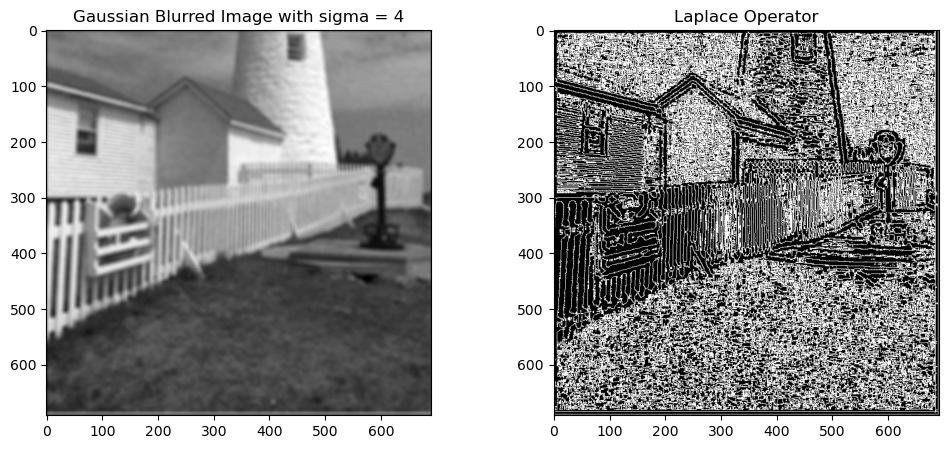

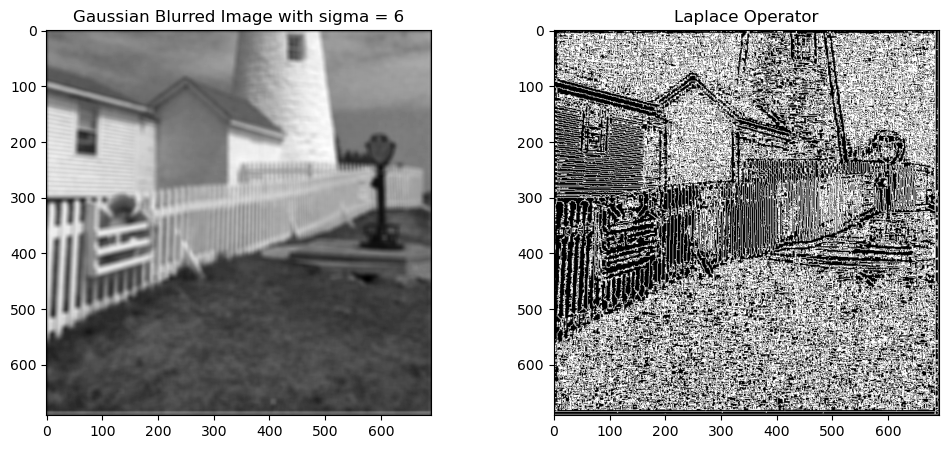

In [83]:
noisy_image = AWGN(lighthouse_img, 10)

fig = plt.figure(figsize = (12, 5))
plt.subplot(1, 2, 1)
plt.imshow(lighthouse_img, cmap = "gray")
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(noisy_image, cmap = "gray")
plt.title('Noisy Image')
plt.show()

edge_map = centered_diff_edge(noisy_image, gradient_choice=1)
edge_map_centered = binarize(edge_map, np.mean(edge_map))

edge_map = roberts_operator(noisy_image, gradient_choice=1)
edge_map_roberts = binarize(edge_map, np.mean(edge_map))

edge_map = prewitt_operator(noisy_image, gradient_choice=1)
edge_map_prewitt = binarize(edge_map, np.mean(edge_map))

edge_map = sobel_operator(noisy_image, gradient_choice=1)
edge_map_sobel = binarize(edge_map, np.mean(edge_map))

fig = plt.figure(figsize = (12, 5))
plt.subplot(1, 2, 1)
plt.imshow(edge_map_centered, cmap = "gray")
plt.title('Centered Difference')

plt.subplot(1, 2, 2)
plt.imshow(edge_map_roberts, cmap = "gray")
plt.title('Roberts Operator')
plt.show()

fig = plt.figure(figsize = (12, 5))
plt.subplot(1, 2, 1)
plt.imshow(edge_map_prewitt, cmap = "gray")
plt.title('Prewitt Operator')

plt.subplot(1, 2, 2)
plt.imshow(edge_map_sobel, cmap = "gray")
plt.title('Sobel Operator')
plt.show()

sigma_values = [2, 3, 4, 6]

for sigma in sigma_values:
    filtered_image = gaussian_blur(noisy_image, 11, sigma)

    fig = plt.figure(figsize = (12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(filtered_image, cmap='gray')
    plt.title('Gaussian Blurred Image with sigma = ' + str(sigma))
    
    plt.subplot(1, 2, 2)
    edge_map = laplacian_edge_detector(filtered_image)
    edge_map = detect_zero_crossing(edge_map)

    plt.imshow(edge_map, cmap = "gray")
    plt.title('Laplace Operator')
    plt.show()

On adding noise, the previous gradient based detectors do not perform as well. In comparison to them, the edge detector with sigma = 4 performs better and seems more robust to noise as well. Thus, the LoG filters are more robust to noise than the gradient based detectors.

##### 3. Template Matching
In this problem, you will write a program to implement template matching using the normalized cross-correlation metric defined in class. Use the definition of cross correlation from slides. See instructions for image and template.

1. Find the normalized cross correlation image.

In [84]:
template_image = np.array(Image.open('template.png').convert('L'))

[[0.93782565 0.93777882 0.93770182 ... 0.93279096 0.93314634 0.93325634]
 [0.93778646 0.93774017 0.93766437 ... 0.93338459 0.93372501 0.93382324]
 [0.93781453 0.93777037 0.93769776 ... 0.93400335 0.93433076 0.93441706]
 ...
 [0.8414702  0.84132756 0.8415486  ... 0.86765224 0.86831915 0.86834671]
 [0.83801256 0.83800256 0.83831385 ... 0.86408548 0.86482573 0.86491969]
 [0.84341118 0.84357511 0.84399494 ... 0.86716739 0.86804984 0.86822784]]


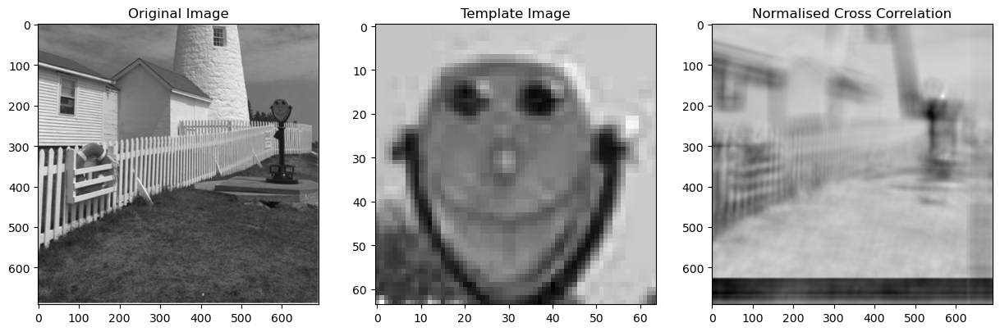

In [85]:
def normalized_cross_correlation(image1, template):

    padded_image = np.pad(image1, ((0, template.shape[0]), (0, template.shape[1])), mode='symmetric')
    
    padded_image = padded_image.astype(np.float64)
    template = template.astype(np.float64)
    
    cross_correlated_image = np.zeros(image1.shape, dtype = np.float64)
    e_b_t = np.zeros(image1.shape, dtype = np.float64)
    epsilon = 1e-16
    
    for i in range(image1.shape[0]):
        for j in range(image1.shape[1]):
            cross_correlated_image[i, j] = np.sum(np.multiply(padded_image[i:i + template.shape[0], j:j + template.shape[1]], template))
            e_b_t[i, j] = np.sum(padded_image[i:i + template.shape[0], j:j + template.shape[1]]**2) + epsilon

    norm_cross_corr = cross_correlated_image / (np.sqrt(np.sum(template**2)) * np.sqrt(e_b_t))

    return norm_cross_corr

ncc_map = normalized_cross_correlation(lighthouse_img, template_image)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(lighthouse_img, cmap='gray')
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(template_image, cmap='gray')
plt.title("Template Image")

plt.subplot(1, 3, 3)
plt.imshow(ncc_map, cmap='gray')
print(ncc_map)
plt.title("Normalised Cross Correlation")
plt.show()

2. What is a good threshold to detect a match?

A normalised cross correlation above 0.95 should be a good threshold to detect a match. Assuming exactly one match, we can take the threshold as the mean of the max value and the second max value in the ncc map. (say this is t)

To take into account the case in which there is no match, we can set the threshold as max (0.95, t).

In [86]:
def thresholding_ncc(ncc_map):
    sorted_map = np.sort(ncc_map.flatten())

    threshold = (sorted_map[-1] + sorted_map[-2])/2
    threshold = max(0.95, threshold)
    answer = np.where(ncc_map > threshold, 1, 0)
    return answer, threshold

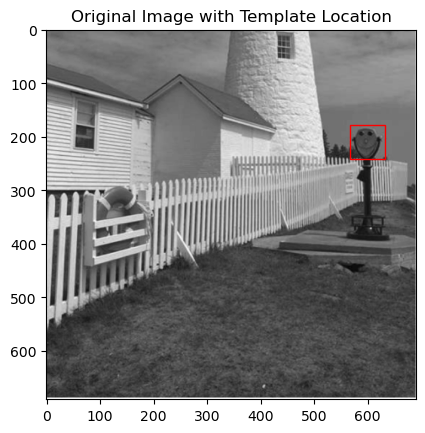

In [87]:
import matplotlib.patches as patches

max_index = np.argmax(thresholding_ncc(ncc_map)[0])
x_max = max_index // lighthouse_img.shape[0]
y_max = max_index % lighthouse_img.shape[1]

plt.imshow(lighthouse_img, cmap = "gray")
rectangle = patches.Rectangle((y_max, x_max), template_image.shape[0], template_image.shape[1], linewidth=1, edgecolor='r', facecolor='none')
plt.gca().add_patch(rectangle)
# plt.plot(y_max, x_max, 'ro')   
plt.title("Original Image with Template Location")
plt.show()

3. Now add Gaussian noise to the template with σ = 1, 3, 5, 10. Repeat steps (1) and (2) at each noise
level. How does the threshold change as noise increases?

Sigma: 1
Threshold: 0.9983252121918447


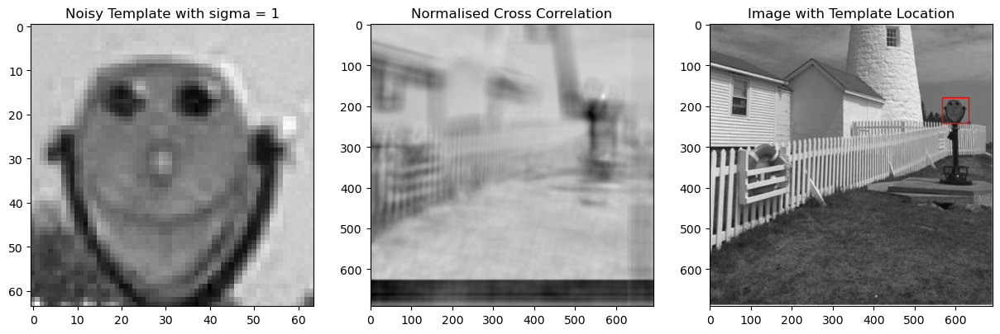

Sigma: 3
Threshold: 0.9978114144880268


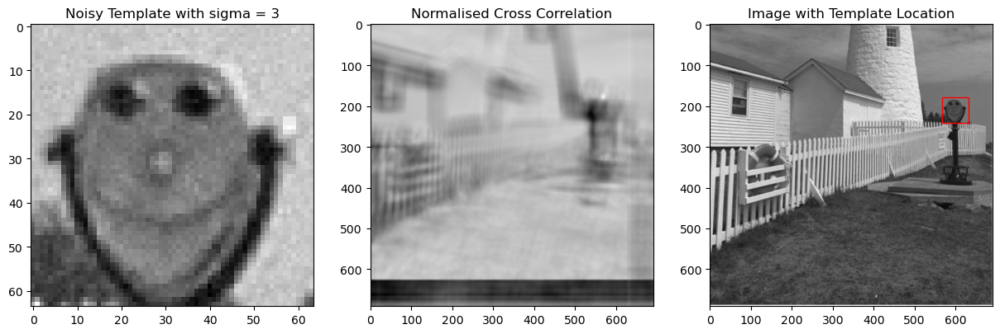

Sigma: 5
Threshold: 0.9968282740123435


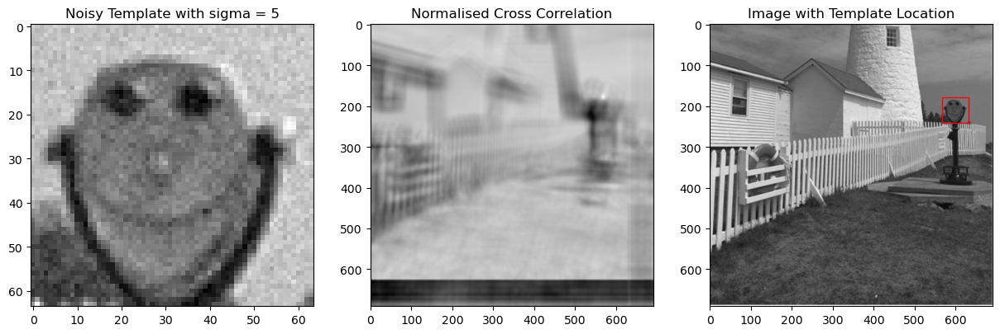

Sigma: 10
Threshold: 0.9919682245117278


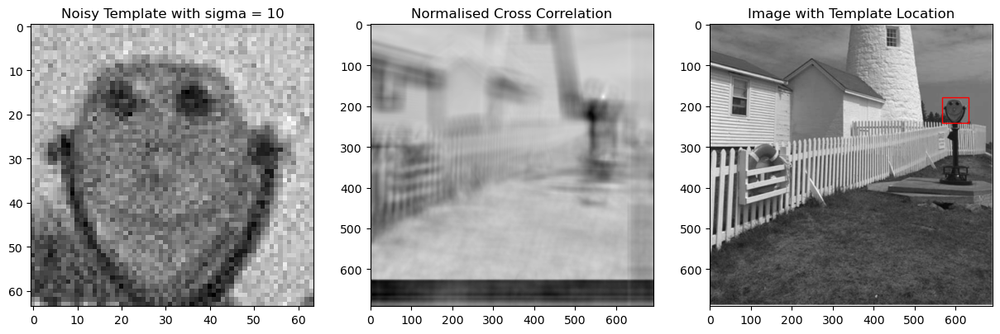

In [88]:
sigma_values = [1, 3, 5, 10]

for sigma in sigma_values:
    print("Sigma:", sigma)
    noisy_template = AWGN(template_image, sigma)

    fig = plt.figure(figsize = (15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(noisy_template, cmap='gray')
    plt.title('Noisy Template with sigma = ' + str(sigma))
    
    ncc_map = normalized_cross_correlation(lighthouse_img, noisy_template)
    thresholded_image, threshold = thresholding_ncc(ncc_map)

    max_index = np.argmax(thresholded_image)   
    print("Threshold:", threshold)

    x_max = max_index // lighthouse_img.shape[0]
    y_max = max_index % lighthouse_img.shape[1]

    plt.subplot(1, 3, 2)
    plt.imshow(ncc_map, cmap = "gray")
    plt.title("Normalised Cross Correlation")

    plt.subplot(1, 3, 3)
    plt.imshow(lighthouse_img, cmap = "gray")
    rectangle = patches.Rectangle((y_max, x_max), noisy_template.shape[0], noisy_template.shape[1], linewidth=1, edgecolor='r', facecolor='none')
    plt.gca().add_patch(rectangle) 
    plt.title("Image with Template Location")
    plt.show()

Thus, threshold decreases as the sigma value increases.

4. Rotate the image at the following angles θ = $5^o, 10^o, 15^o$. Repeat steps (1) and (2) at each angle. How
does the threshold change as rotation increases? Implement rotation using the rotation matrix


In [89]:
def rotate_image(image, angle):
    angle = np.deg2rad(angle)
    rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])
    rotated_image = np.zeros(image.shape)

    for i in range(rotated_image.shape[0]):
        for j in range(rotated_image.shape[1]):
            # new_coordinates = np.dot(rotation_matrix, np.array([i - (image.shape[0]//2), j - (image.shape[1]//2)]))
            # x_new = int(new_coordinates[0]) + (image.shape[0]//2)
            # y_new = int(new_coordinates[1]) + (image.shape[1]//2)
            old_coords = np.dot(rotation_matrix, np.array([i - (image.shape[0]//2), j - (image.shape[1]//2)]))
            x_old = int(old_coords[0]) + (image.shape[0]//2)
            y_old = int(old_coords[1]) + (image.shape[1]//2)

            if (x_old >= 0 and x_old < image.shape[0] and y_old >= 0 and y_old < image.shape[1]):
                rotated_image[i, j] = image[x_old, y_old]
            else:
                # interpolation
                rotated_image[i, j] = image[np.clip(x_old, 0, image.shape[0] - 1), np.clip(y_old, 0, image.shape[1] - 1)]

    return rotated_image

Angle: 5
Threshold: 0.9914801367865606


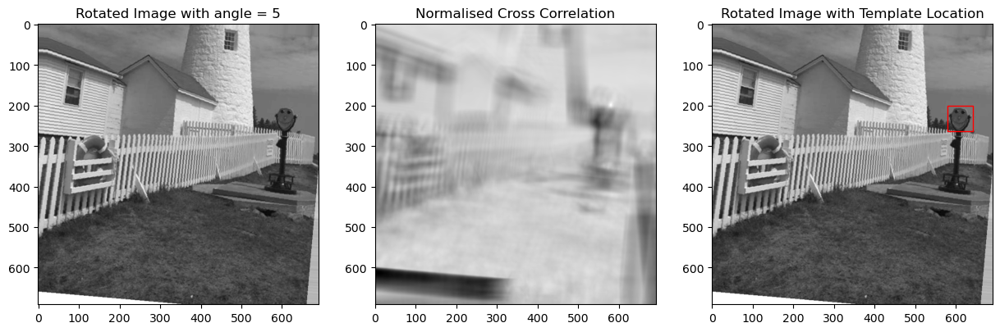

Angle: 10
Threshold: 0.9830314280618045


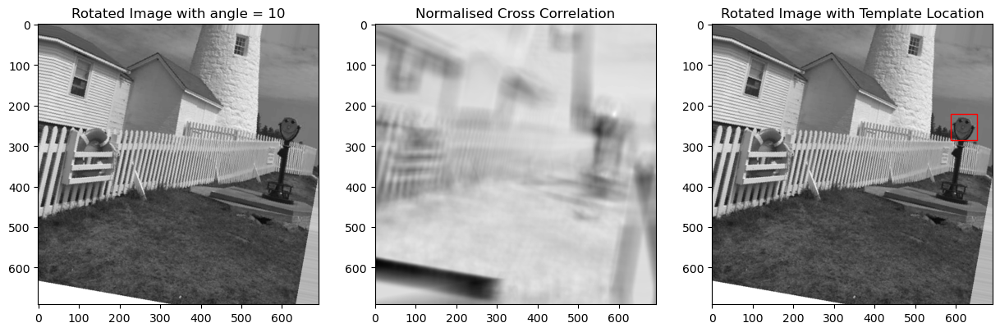

Angle: 15
Threshold: 0.9749998363850623


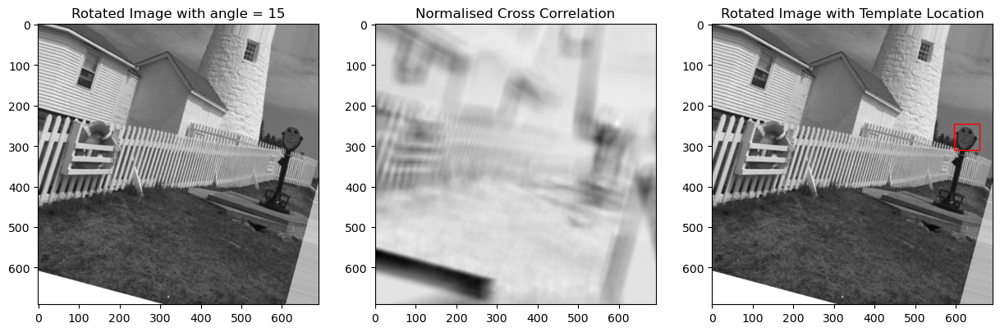

In [90]:
angle_values = [5, 10, 15]

for angle in angle_values:
    print("Angle:", angle)
    rotated_image = rotate_image(lighthouse_img, angle)

    fig = plt.figure(figsize = (15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(rotated_image, cmap='gray')
    plt.title('Rotated Image with angle = ' + str(angle))

    ncc_map = normalized_cross_correlation(rotated_image, template_image)
    thresholded_image, threshold = thresholding_ncc(ncc_map)

    max_index = np.argmax(thresholded_image)   
    print("Threshold:", threshold)

    x_max = max_index // lighthouse_img.shape[0]
    y_max = max_index % lighthouse_img.shape[1]

    plt.subplot(1, 3, 2)
    plt.imshow(ncc_map, cmap = "gray")
    plt.title("Normalised Cross Correlation")

    plt.subplot(1, 3, 3)
    plt.imshow(rotated_image, cmap = "gray")
    rectangle = patches.Rectangle((y_max, x_max), template_image.shape[0], template_image.shape[1], linewidth=1, edgecolor='r', facecolor='none')
    plt.gca().add_patch(rectangle)
    # plt.plot(y_max, x_max, 'ro')   
    plt.title("Rotated Image with Template Location")
    plt.show()